Student Performance

About Dataset

Description:
The Student Performance Dataset is a dataset designed to examine the factors influencing academic student performance. The dataset consists of 10,000 student records, with each record containing information about various predictors and a performance index.

Variables:
Hours Studied: The total number of hours spent studying by each student.
Previous Scores: The scores obtained by students in previous tests.
Extracurricular Activities: Whether the student participates in extracurricular activities (Yes or No).
Sleep Hours: The average number of hours of sleep the student had per day.
Sample Question Papers Practiced: The number of sample question papers the student practiced.

Target Variable:

Performance Index: A measure of the overall performance of each student. The performance index represents the student's academic performance and has been rounded to the nearest integer. The index ranges from 10 to 100, with higher values indicating better performance.
The dataset aims to provide insights into the relationship between the predictor variables and the performance index. Researchers and data analysts can use this dataset to explore the impact of studying hours, previous scores, extracurricular activities, sleep hours, and sample question papers on student performance.

P.S: Please note that this dataset is synthetic and created for illustrative purposes. The relationships between the variables and the performance index may not reflect real-world scenarios

link:
https://www.kaggle.com/datasets/nikhil7280/student-performance-multiple-linear-regression/data

# Importing Libraries

In [9]:
import os

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings("ignore")

# Importing Dataset

In [10]:
student_df = pd.read_csv("Student_Performance.csv")
#pd.read_csv("/kaggle/input/student-performance-multiple-linear-regression/Student_Performance.csv")
student_df.head(5)

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0


In [11]:
student_df

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0
5,3,78,No,9,6,61.0
6,7,73,Yes,5,6,63.0
7,8,45,Yes,4,6,42.0
8,5,77,No,8,2,61.0
9,4,89,No,4,0,69.0


# Sanity check - checking NaN and Duplicates

## Checking NaN Values

In [12]:
student_df.isna().all(axis=1).sum()

0

In [13]:
student_df.isna().sum()

,0
Hours Studied,0
Previous Scores,0
Extracurricular Activities,0
Sleep Hours,0
Sample Question Papers Practiced,0
Performance Index,0


In [14]:
# No Nan values are present

## Checking Duplicates

In [15]:
student_df.duplicated().value_counts()

,count
False,9873
True,127


In [16]:
# Duplicate rows are present

In [17]:
len(student_df.drop_duplicates())

9873

In [18]:
# Dropping Duplicate rows
student_df = student_df.drop_duplicates()
student_df.shape

(9873, 6)

In [19]:
student_df.duplicated().value_counts()

,count
False,9873


# Reindexing the dataset

In [20]:
student_df.tail(5)

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
9995,1,49,Yes,4,2,23.0
9996,7,64,Yes,8,5,58.0
9997,6,83,Yes,8,5,74.0
9998,9,97,Yes,7,0,95.0
9999,7,74,No,8,1,64.0


In [21]:
student_df.reset_index().head()

,index,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,0,7,99,Yes,9,1,91.0
1,1,4,82,No,4,2,65.0
2,2,8,51,Yes,7,2,45.0
3,3,5,52,Yes,5,2,36.0
4,4,7,75,No,8,5,66.0


In [22]:
student_df.reset_index(drop=True)
student_df.head(5)

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0


In [23]:
student_df = student_df.reset_index(drop=True)
student_df

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
0,7,99,Yes,9,1,91.0
1,4,82,No,4,2,65.0
2,8,51,Yes,7,2,45.0
3,5,52,Yes,5,2,36.0
4,7,75,No,8,5,66.0
5,3,78,No,9,6,61.0
6,7,73,Yes,5,6,63.0
7,8,45,Yes,4,6,42.0
8,5,77,No,8,2,61.0
9,4,89,No,4,0,69.0


# Initial EDA

In [24]:
student_df.dtypes

,0
Hours Studied,int64
Previous Scores,int64
Extracurricular Activities,object
Sleep Hours,int64
Sample Question Papers Practiced,int64
Performance Index,float64


In [25]:
student_df['Extracurricular Activities'].value_counts()

,count
Extracurricular Activities,
No,4986
Yes,4887


In [26]:
student_df.describe(include='all')

,Hours Studied,Previous Scores,Extracurricular Activities,Sleep Hours,Sample Question Papers Practiced,Performance Index
count,9873.000000,9873.000000,9873,9873.000000,9873.000000,9873.000000
unique,NaN,NaN,2,NaN,NaN,NaN
top,NaN,NaN,No,NaN,NaN,NaN
freq,NaN,NaN,4986,NaN,NaN,NaN
mean,4.992100,69.441102,NaN,6.531652,4.583004,55.216651
std,2.589081,17.325601,NaN,1.697683,2.867202,19.208570
min,1.000000,40.000000,NaN,4.000000,0.000000,10.000000
25%,3.000000,54.000000,NaN,5.000000,2.000000,40.000000
50%,5.000000,69.000000,NaN,7.000000,5.000000,55.000000
75%,7.000000,85.000000,NaN,8.000000,7.000000,70.000000


In [27]:
# Only one categorical column is present
# Column names have Spaces it is better to convert the space to _

# Handlling space in Column name

In [28]:
student_df.columns

Index(['Hours Studied', 'Previous Scores', 'Extracurricular Activities',
       'Sleep Hours', 'Sample Question Papers Practiced', 'Performance Index'],
      dtype='object')

In [29]:
student_df.columns.str.replace(' ','_')

Index(['Hours_Studied', 'Previous_Scores', 'Extracurricular_Activities',
       'Sleep_Hours', 'Sample_Question_Papers_Practiced', 'Performance_Index'],
      dtype='object')

In [30]:
student_df.columns = student_df.columns.str.replace(' ','_')
student_df.columns

Index(['Hours_Studied', 'Previous_Scores', 'Extracurricular_Activities',
       'Sleep_Hours', 'Sample_Question_Papers_Practiced', 'Performance_Index'],
      dtype='object')

# Seperating Numerical and Categorical Columns

In [31]:
student_df.dtypes == 'object'

,0
Hours_Studied,False
Previous_Scores,False
Extracurricular_Activities,True
Sleep_Hours,False
Sample_Question_Papers_Practiced,False
Performance_Index,False


In [32]:
student_df.columns[student_df.dtypes == 'object']

Index(['Extracurricular_Activities'], dtype='object')

In [33]:
cat_cols = student_df.columns[student_df.dtypes == 'object']
cat_cols

Index(['Extracurricular_Activities'], dtype='object')

In [34]:
student_df.dtypes != 'object'

,0
Hours_Studied,True
Previous_Scores,True
Extracurricular_Activities,False
Sleep_Hours,True
Sample_Question_Papers_Practiced,True
Performance_Index,True


In [35]:
student_df.columns[student_df.dtypes != 'object']

Index(['Hours_Studied', 'Previous_Scores', 'Sleep_Hours',
       'Sample_Question_Papers_Practiced', 'Performance_Index'],
      dtype='object')

In [36]:
num_cols = student_df.columns[student_df.dtypes != 'object']
num_cols

Index(['Hours_Studied', 'Previous_Scores', 'Sleep_Hours',
       'Sample_Question_Papers_Practiced', 'Performance_Index'],
      dtype='object')

# Handling Missing value - NA

# Handling outliers

In [37]:
student_df.describe()

,Hours_Studied,Previous_Scores,Sleep_Hours,Sample_Question_Papers_Practiced,Performance_Index
count,9873.000000,9873.000000,9873.000000,9873.000000,9873.000000
mean,4.992100,69.441102,6.531652,4.583004,55.216651
std,2.589081,17.325601,1.697683,2.867202,19.208570
min,1.000000,40.000000,4.000000,0.000000,10.000000
25%,3.000000,54.000000,5.000000,2.000000,40.000000
50%,5.000000,69.000000,7.000000,5.000000,55.000000
75%,7.000000,85.000000,8.000000,7.000000,70.000000
max,9.000000,99.000000,9.000000,9.000000,100.000000


In [38]:
def box_dist_plot(df, col):
  plt.figure(figsize=(16,8))

  plt.subplot(1,2,1)
  sns.boxplot(df[col])
  plt.ylabel(col)

  plt.subplot(1,2,2)
  sns.distplot(df[col], kde=True)
  plt.ylabel(col)

  plt.show()



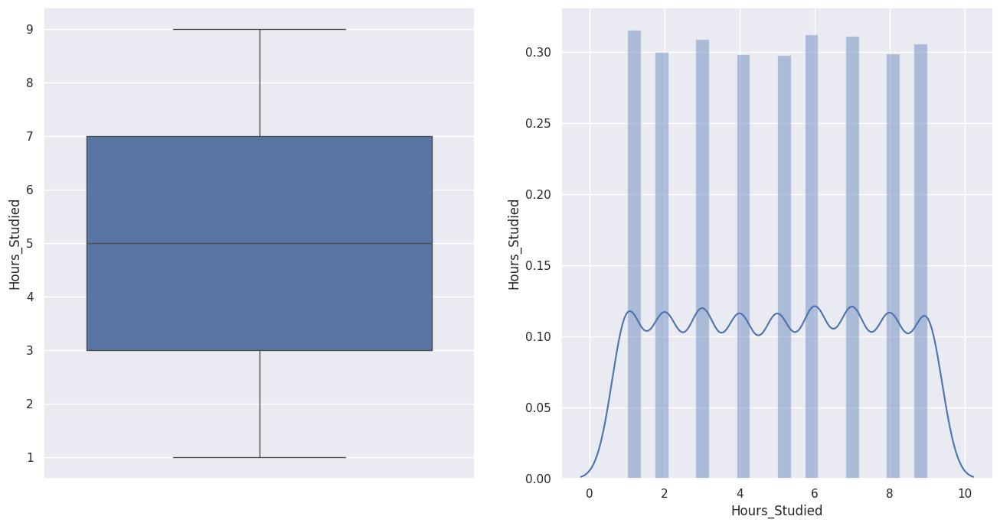

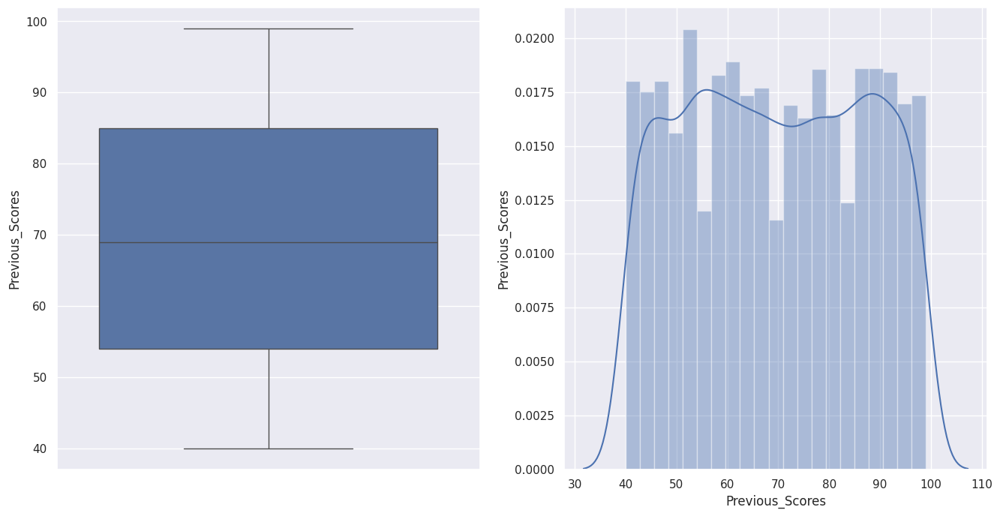

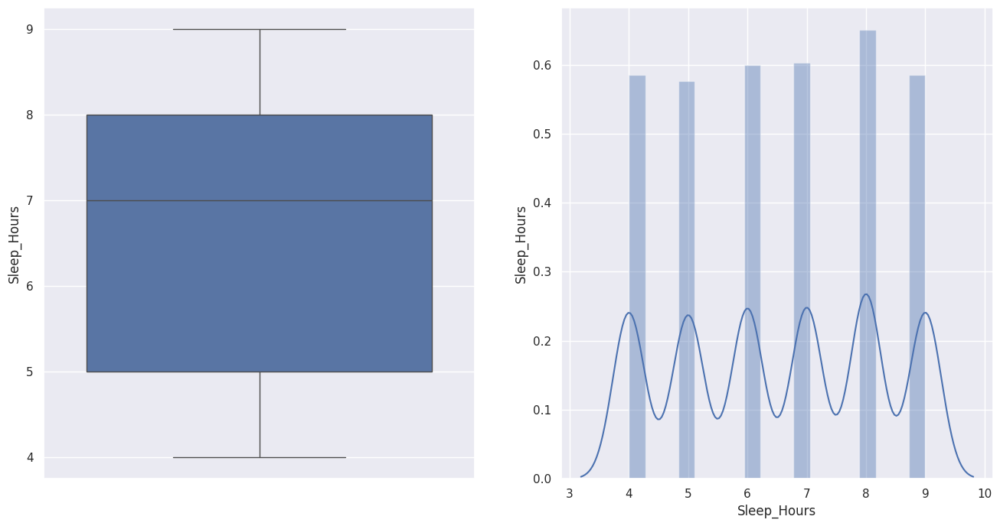

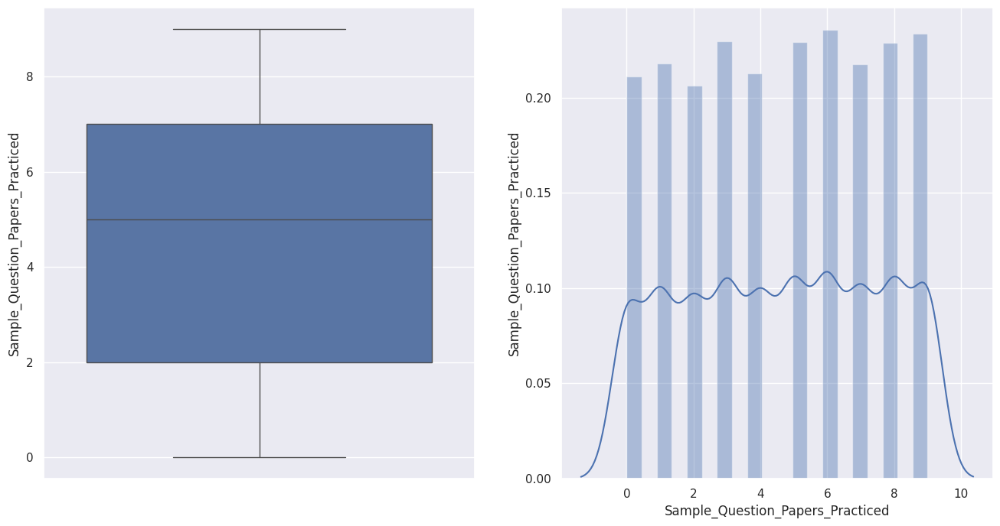

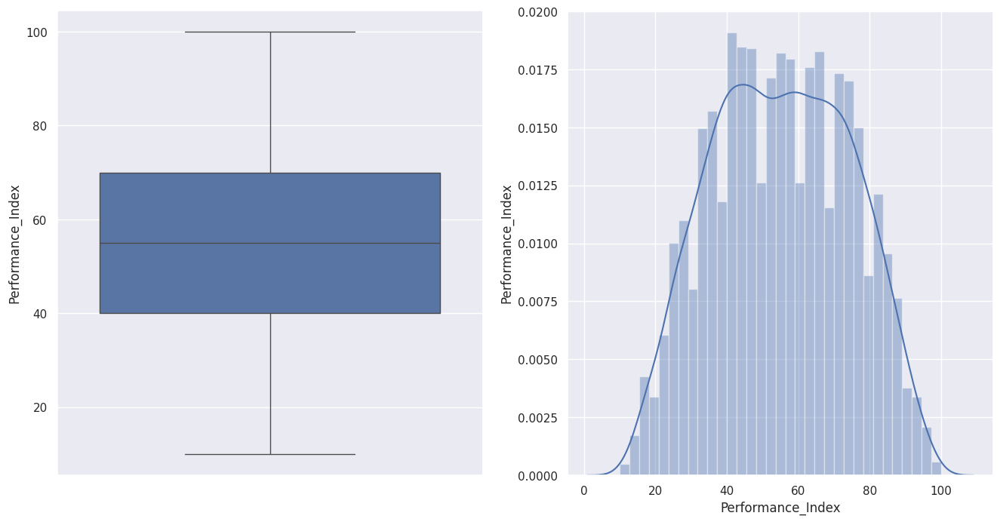

In [39]:
for col in num_cols:
  box_dist_plot(student_df, col)

In [40]:
#No outliers in numerical columns

# Analyzing categorical column

In [41]:
student_df[cat_cols].value_counts()

,count
Extracurricular_Activities,
No,4986
Yes,4887


In [42]:
student_df.columns

Index(['Hours_Studied', 'Previous_Scores', 'Extracurricular_Activities',
       'Sleep_Hours', 'Sample_Question_Papers_Practiced', 'Performance_Index'],
      dtype='object')

# Visualization

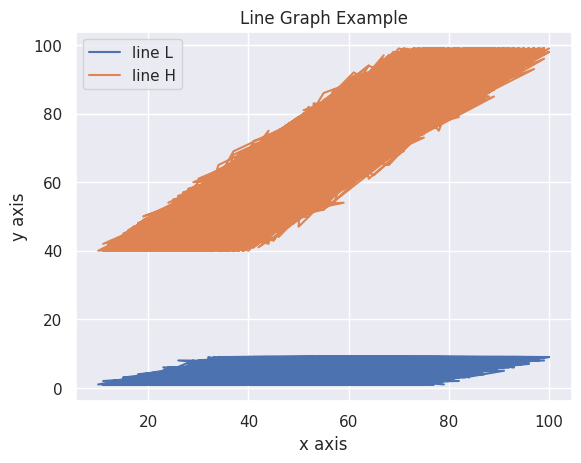

In [43]:
plt.plot(student_df['Performance_Index'], student_df['Hours_Studied'], label="line L")
plt.plot(student_df['Performance_Index'], student_df['Previous_Scores'], label="line H")


plt.plot()

plt.xlabel("x axis")
plt.ylabel("y axis")
plt.title("Line Graph Example")
plt.legend()
plt.show()

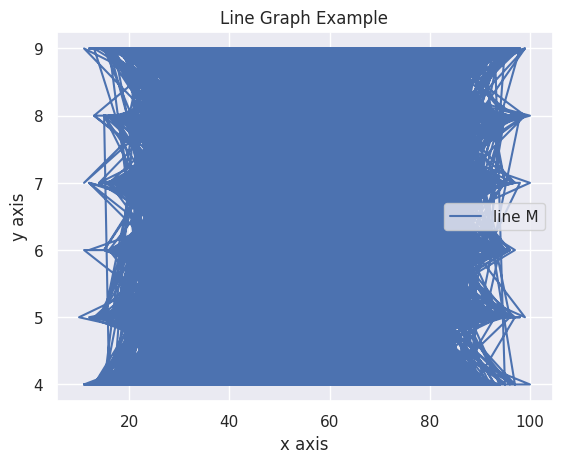

In [44]:
plt.plot(student_df['Performance_Index'], student_df['Sleep_Hours'], label="line M")

plt.plot()

plt.xlabel("x axis")
plt.ylabel("y axis")
plt.title("Line Graph Example")
plt.legend()
plt.show()

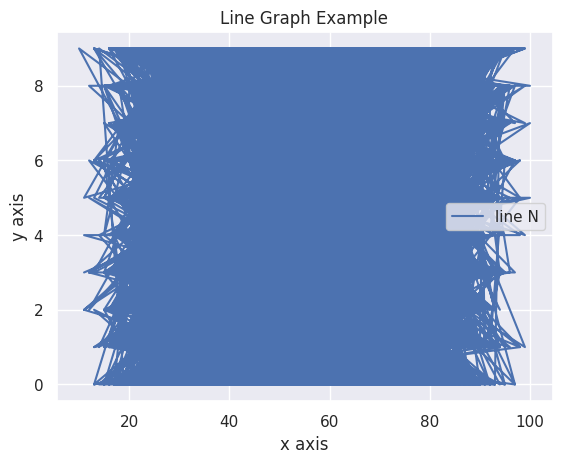

In [45]:

plt.plot(student_df['Performance_Index'], student_df['Sample_Question_Papers_Practiced'], label="line N")

plt.plot()

plt.xlabel("x axis")
plt.ylabel("y axis")
plt.title("Line Graph Example")
plt.legend()
plt.show()

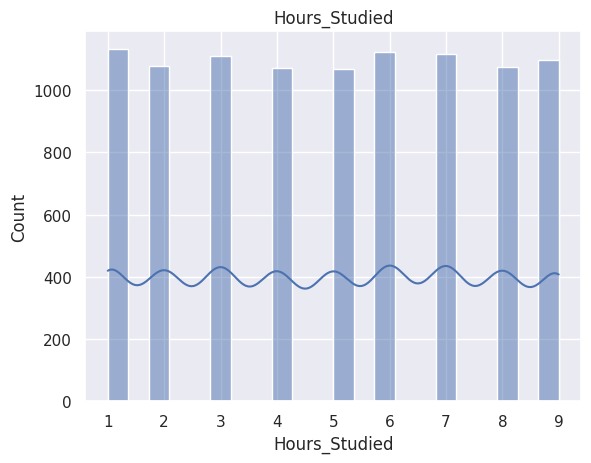

Minimum Hours_Studied: 1
Maximum Hours_Studied: 9
Mean Hours_Studied: 4.99209966575509
Median Hours_Studied: 5.0
Mode Hours_Studied: 0    1
Name: Hours_Studied, dtype: int64
Standard Deviation Hours_Studied: 2.589081138944193
Variance Hours_Studied: 6.703341144036558
Skewness Hours_Studied: -0.0033483737916364534
Kurtosis Hours_Studied: -1.2337699833952724


In [46]:
# Hours_Studied

sns.histplot(data=student_df['Hours_Studied'], kde=True)
plt.title("Hours_Studied")
plt.show()

print("Minimum Hours_Studied:",student_df['Hours_Studied'].min())
print("Maximum Hours_Studied:",student_df['Hours_Studied'].max())
print("Mean Hours_Studied:",student_df['Hours_Studied'].mean())
print("Median Hours_Studied:",student_df['Hours_Studied'].median())
print("Mode Hours_Studied:",student_df['Hours_Studied'].mode())
print("Standard Deviation Hours_Studied:",student_df['Hours_Studied'].std())
print("Variance Hours_Studied:",student_df['Hours_Studied'].var())
print("Skewness Hours_Studied:",student_df['Hours_Studied'].skew())
print("Kurtosis Hours_Studied:",student_df['Hours_Studied'].kurt())

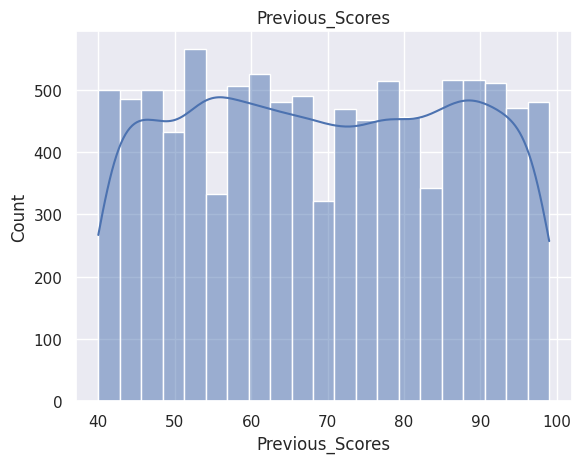

Minimum Previous_Scores: 40
Maximum Previous_Scores: 99
Mean Previous_Scores: 69.44110199534083
Median Previous_Scores: 69.0
Mode Previous_Scores: 0    54
Name: Previous_Scores, dtype: int64
Standard Deviation Previous_Scores: 17.32560125228179
Variance Previous_Scores: 300.1764587530683
Skewness Previous_Scores: 0.0055813419610842956
Kurtosis Previous_Scores: -1.2116826321592524


In [47]:
# Previous_Scores

sns.histplot(data=student_df['Previous_Scores'], kde=True)
plt.title("Previous_Scores")
plt.show()

print("Minimum Previous_Scores:",student_df['Previous_Scores'].min())
print("Maximum Previous_Scores:",student_df['Previous_Scores'].max())
print("Mean Previous_Scores:",student_df['Previous_Scores'].mean())
print("Median Previous_Scores:",student_df['Previous_Scores'].median())
print("Mode Previous_Scores:",student_df['Previous_Scores'].mode())
print("Standard Deviation Previous_Scores:",student_df['Previous_Scores'].std())
print("Variance Previous_Scores:",student_df['Previous_Scores'].var())
print("Skewness Previous_Scores:",student_df['Previous_Scores'].skew())
print("Kurtosis Previous_Scores:",student_df['Previous_Scores'].kurt())

1. Central Tendency - Mean, Median, Mode

    -> mean and median are quite close, suggesting a relatively symmetrical distribution.

    -> mode being 54 indicates a significant number of scores around this value, but it's not the most common score overall.

2. Dispersion - Min, Max, SD, Variance

    -> Range (99 - 40 = 59) indicates a decent spread of scores.

    -> Standard deviation is relatively small, suggesting that most scores are clustered around the mean

3. Shape - Skewness, Kurtosis

    -> Skewness is very close to zero, indicating a roughly symmetrical distribution
     
    -> Kurtosis is negative, suggesting a flatter distribution than a normal distribution (leptokurtic). This might mean there are fewer extreme outliers

Overall Assessment:

The distribution of Previous_Scores appears to be approximately normal, with a slight tendency towards flatness.
The majority of scores are clustered around the mean of 69.44, with a relatively small spread.
There are no significant outliers or extreme values.





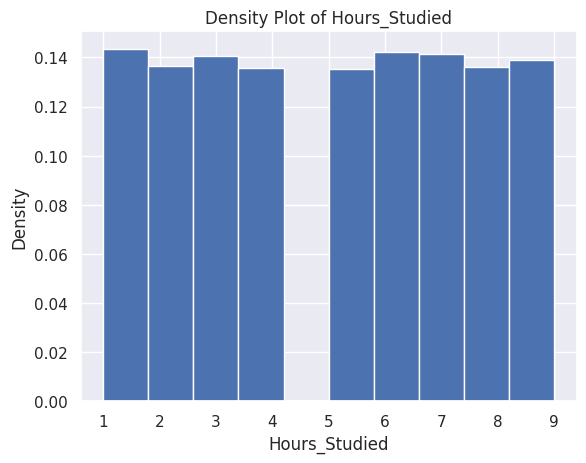

In [48]:
plt.hist(student_df['Hours_Studied'], density=True)
plt.xlabel('Hours_Studied')
plt.ylabel('Density')
plt.title('Density Plot of Hours_Studied')
plt.show()

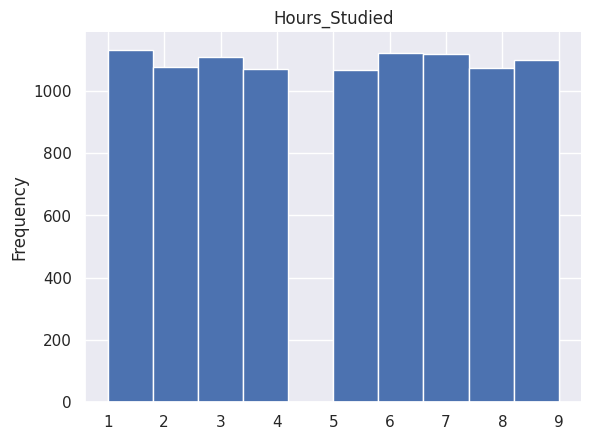

In [49]:
student_df['Hours_Studied'].plot(kind='hist', title='Hours_Studied')
plt.gca().spines[['top', 'right',]].set_visible(False)

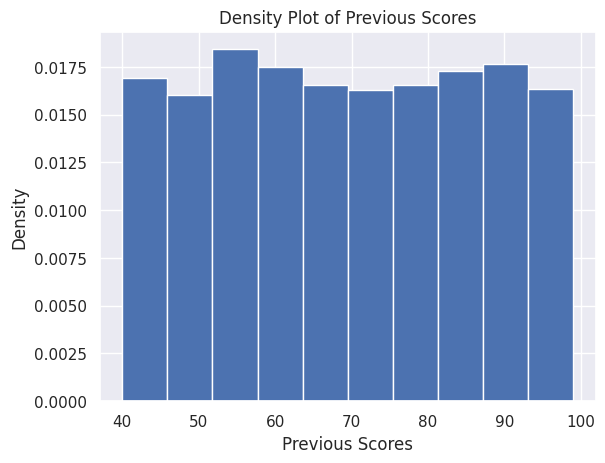

In [50]:
plt.hist(student_df['Previous_Scores'], density=True)
plt.xlabel('Previous Scores')
plt.ylabel('Density')
plt.title('Density Plot of Previous Scores')
plt.show()

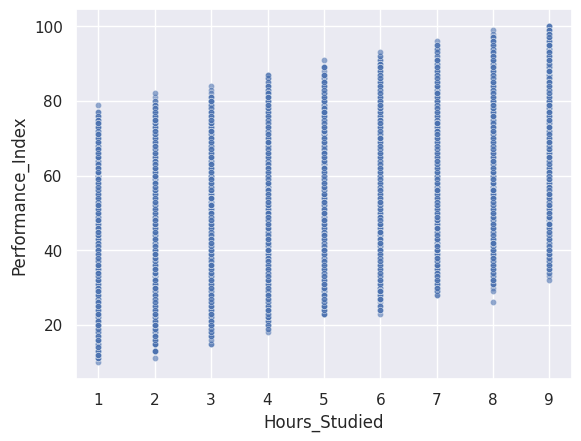

In [51]:
sns.scatterplot(data=student_df, x='Hours_Studied', y='Performance_Index', s=20, alpha=.6)
plt.show()

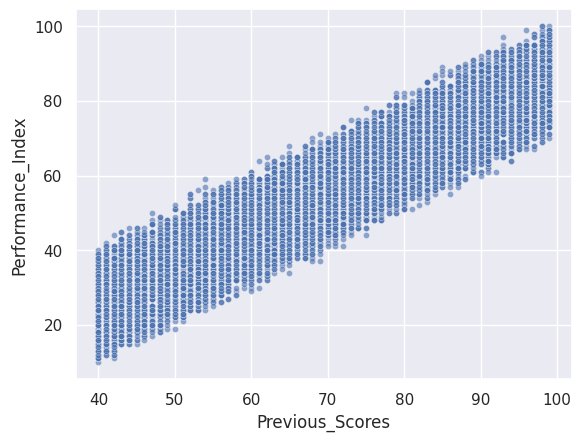

In [52]:
sns.scatterplot(data=student_df, x='Previous_Scores', y='Performance_Index', s=20, alpha=.6)
plt.show()

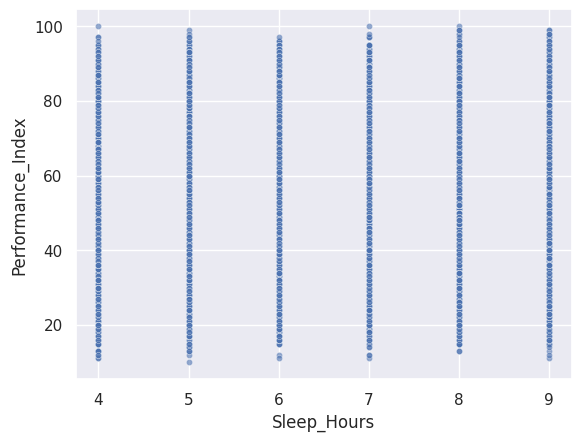

In [53]:
sns.scatterplot(data=student_df, x='Sleep_Hours', y='Performance_Index', s=20, alpha=.6)
plt.show()

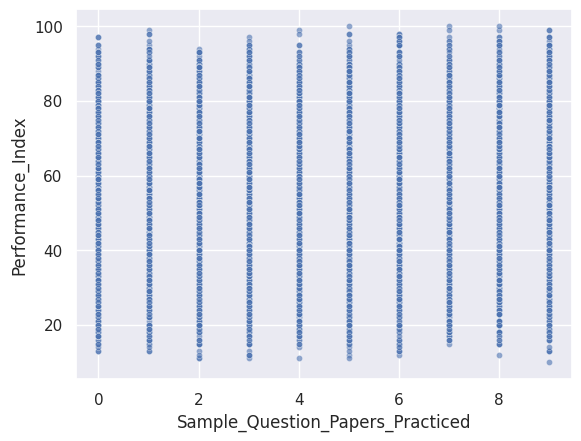

In [54]:
sns.scatterplot(data=student_df, x='Sample_Question_Papers_Practiced', y='Performance_Index', s=20, alpha=.6)
plt.show()

In [55]:
"""plt.figure(figsize=(20,15))
corr = student_df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()"""

ValueError: could not convert string to float: 'Yes'

<Figure size 2000x1500 with 0 Axes>

# EDA

In [ ]:
!pip install dtale

In [ ]:
import dtale
import dtale.app as dtale_app

In [ ]:
dtale.show(student_df)

# Encoding the Categorical Feature

In [56]:
student_df['Extracurricular_Activities'].value_counts()

,count
Extracurricular_Activities,
No,4986
Yes,4887


In [57]:
student_df['Extracurricular_Activities'].replace({'Yes':1, 'No':0})

,Extracurricular_Activities
0,1
1,0
2,1
3,1
4,0
5,0
6,1
7,1
8,0
9,0


In [58]:
student_df['Extracurricular_Activities'].replace({'Yes':1, 'No':0}).value_counts()

,count
Extracurricular_Activities,
0,4986
1,4887


In [59]:
student_df['Extracurricular_Activities'] = student_df['Extracurricular_Activities'].replace({'Yes':1, 'No':0})
student_df['Extracurricular_Activities'].value_counts()

,count
Extracurricular_Activities,
0,4986
1,4887


In [60]:
student_df.head(2)

,Hours_Studied,Previous_Scores,Extracurricular_Activities,Sleep_Hours,Sample_Question_Papers_Practiced,Performance_Index
0,7,99,1,9,1,91.0
1,4,82,0,4,2,65.0


# Splitting the Independent and Dependent Features

In [61]:
student_df[['Performance_Index']]

,Performance_Index
0,91.0
1,65.0
2,45.0
3,36.0
4,66.0
5,61.0
6,63.0
7,42.0
8,61.0
9,69.0


In [62]:
y = student_df[['Performance_Index']]
y.head(2)

,Performance_Index
0,91.0
1,65.0


In [63]:
student_df.drop(columns=['Performance_Index'])

,Hours_Studied,Previous_Scores,Extracurricular_Activities,Sleep_Hours,Sample_Question_Papers_Practiced
0,7,99,1,9,1
1,4,82,0,4,2
2,8,51,1,7,2
3,5,52,1,5,2
4,7,75,0,8,5
5,3,78,0,9,6
6,7,73,1,5,6
7,8,45,1,4,6
8,5,77,0,8,2
9,4,89,0,4,0


In [64]:
x = student_df.drop(columns=['Performance_Index'])
x.head(2)

,Hours_Studied,Previous_Scores,Extracurricular_Activities,Sleep_Hours,Sample_Question_Papers_Practiced
0,7,99,1,9,1
1,4,82,0,4,2


# Feature Scaling

## Min-Max Scaler

In [65]:
from sklearn.preprocessing import MinMaxScaler
minmax_s = MinMaxScaler()

In [66]:
minmax_s.fit(x)

MinMaxScaler()

In [67]:
x_minmax = minmax_s.transform(x)
x_minmax

array([[0.75      , 1.        , 1.        , 1.        , 0.11111111],
       [0.375     , 0.71186441, 0.        , 0.        , 0.22222222],
       [0.875     , 0.18644068, 1.        , 0.6       , 0.22222222],
       ...,
       [0.625     , 0.72881356, 1.        , 0.8       , 0.55555556],
       [1.        , 0.96610169, 1.        , 0.6       , 0.        ],
       [0.75      , 0.57627119, 0.        , 0.8       , 0.11111111]])

In [68]:
x_minmax = pd.DataFrame(x_minmax, columns=x.columns)
x_minmax.head(2)

,Hours_Studied,Previous_Scores,Extracurricular_Activities,Sleep_Hours,Sample_Question_Papers_Practiced
0,0.750,1.000000,1.0,1.0,0.111111
1,0.375,0.711864,0.0,0.0,0.222222


## Normalization

In [69]:
from sklearn.preprocessing import Normalizer
nor = Normalizer()


In [70]:
nor.fit(x)

Normalizer()

In [71]:
x_norm = nor.transform(x)
x_norm


array([[0.07023568, 0.99333326, 0.01003367, 0.09030302, 0.01003367],
       [0.04865043, 0.99733372, 0.        , 0.04865043, 0.02432521],
       [0.1534212 , 0.97806017, 0.01917765, 0.13424355, 0.0383553 ],
       ...,
       [0.071637  , 0.99097855, 0.0119395 , 0.095516  , 0.0596975 ],
       [0.09214427, 0.99311044, 0.01023825, 0.07166776, 0.        ],
       [0.09362507, 0.9897507 , 0.        , 0.10700008, 0.01337501]])

In [72]:
x_norm = pd.DataFrame(x_norm, columns=x.columns)
x_norm.head(2)

,Hours_Studied,Previous_Scores,Extracurricular_Activities,Sleep_Hours,Sample_Question_Papers_Practiced
0,0.070236,0.993333,0.010034,0.090303,0.010034
1,0.048650,0.997334,0.000000,0.048650,0.024325


# Min-MAx Scaled Data

## VIF - Variance Inflation Factor - To Check correlation b/w independent variables

In [73]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variable = x_minmax # Feature scaled independent variable
vif = pd.DataFrame()
#Check each column with remaining column

vif['variance_inflation_factor'] = [variance_inflation_factor(variable, i)
                                    for i in range(variable.shape[1])]

vif['features'] = variable.columns
vif



,variance_inflation_factor,features
0,2.714693,Hours_Studied
1,2.963387,Previous_Scores
2,1.821315,Extracurricular_Activities
3,2.622494,Sleep_Hours
4,2.847615,Sample_Question_Papers_Practiced


If VIF is less than 5, no correlation between independent features

## Splitting Train and Val data

In [74]:
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(x_minmax, y, test_size=0.25, random_state=42)

In [75]:
x_train.shape, y_train.shape

((7404, 5), (7404, 1))

In [76]:
x_val.shape, y_val.shape

((2469, 5), (2469, 1))

## Model 1: Linear Regression model

In [77]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [78]:
lr.fit(x_train, y_train)

LinearRegression()

In [79]:
lr.score(x_train, y_train)

0.9887979467634684

In [80]:
print("Coefficient:",lr.coef_)
print("Intercept:",lr.intercept_)


Coefficient: [[22.82914543 60.06317288  0.57797717  2.3576485   1.71030218]]
Intercept: [11.48366232]


In [81]:
y_train_pred = lr.predict(x_train)
y_val_predict = lr.predict(x_val)

### Evalution Metrics

In [82]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [83]:
mse = mean_squared_error(y_val, y_val_predict)
print("Mean Squared Error: ",mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error: ",rmse)
mae = mean_absolute_error(y_val, y_val_predict)
print("Mean Absolute Error: ",mae)
r2 = r2_score(y_val, y_val_predict)
print("R2 Score(Accuracy): ", r2)

Mean Squared Error:  4.317099922622563
Root Mean Squared Error:  2.0777632017683256
Mean Absolute Error:  1.6486334804527567
R2 Score(Accuracy):  0.9883149212472456


## Oridinary Least Square

### Splitting test and val data from original dataset(unscaled)

In [84]:
x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.25, random_state=42)

In [85]:
x_train.shape, y_train.shape

((7404, 5), (7404, 1))

In [86]:
x_val.shape, y_val.shape

((2469, 5), (2469, 1))

### Building Model

In [87]:
from statsmodels.regression.linear_model import OLS
import statsmodels.regression.linear_model as smf

In [88]:
reg_model = smf.OLS(endog = y_train, exog = x_train).fit()

In [89]:
reg_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Performance_Index   R-squared (uncentered):                   0.990
Model:                            OLS   Adj. R-squared (uncentered):              0.990
Method:                 Least Squares   F-statistic:                          1.478e+05
Date:                Sun, 01 Sep 2024   Prob (F-statistic):                        0.00
Time:                        06:58:17   Log-Likelihood:                         -23532.
No. Observations:                7404   AIC:                                  4.707e+04
Df Residuals:                    7399   BIC:                                  4.711e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Hours_Studied                        2.2004      0.025     88.656      0.000       2.152       2.249
Previous_Scores                      0.8173      0.003    272.659      0.000       0.811       0.823
Extracurricular_Activities          -1.1958      0.133     -8.970      0.000      -1.457      -0.934
Sleep_Hours                         -1.4971      0.031    -47.792      0.000      -1.558      -1.436
Sample_Question_Papers_Practiced    -0.2812      0.023    -12.297      0.000      -0.326      -0.236
==============================================================================
Omnibus:                       40.822   Durbin-Watson:                   1.938
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.358
Skew:                          -0.015   Prob(JB):                     4.22e-07
Kurtosis:                       2.693   Cond. No.                         142.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Accuracy

R-squared (uncentered):	0.990

P value - All independent variables are statically significant as p<= 0.05

# Assumption Check

## Assumption 1 - Multi-collinearity validation

### HeatMap

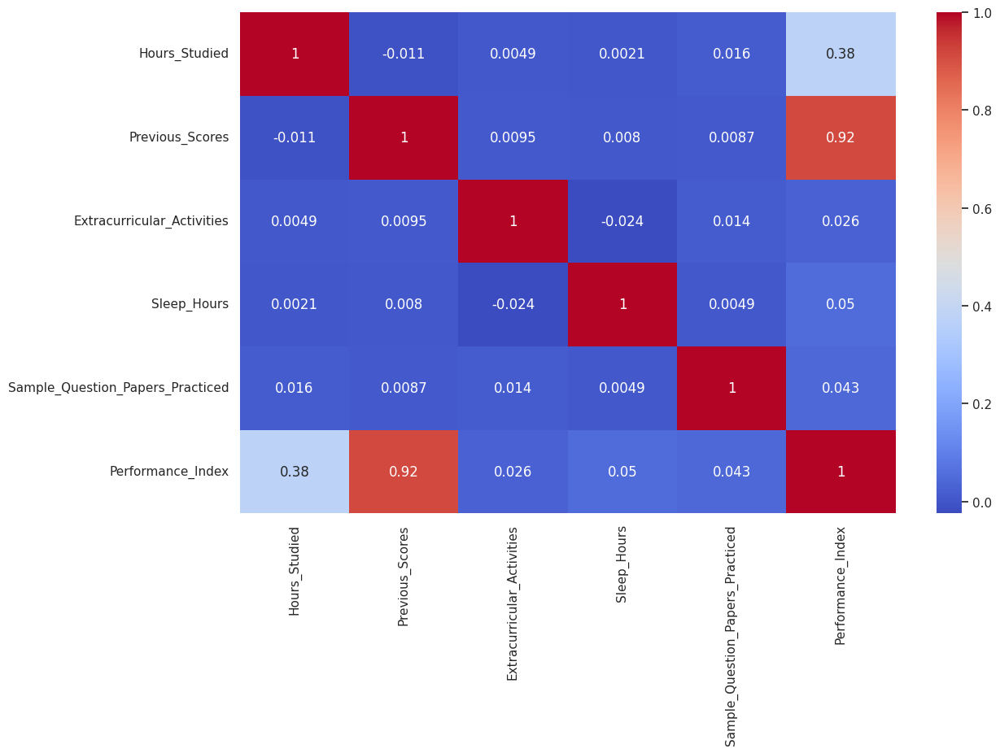

In [90]:
plt.figure(figsize=(13,8))
corr = student_df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

Independent Features don't have value more than 0.8 - No multi-collinearity

### VIF - Variance Inflation Factor

In [91]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variable = x_minmax # Feature scaled independent variable
vif = pd.DataFrame()
#Check each column with remaining column

vif['variance_inflation_factor'] = [variance_inflation_factor(variable, i)
                                    for i in range(variable.shape[1])]

vif['features'] = variable.columns
vif



,variance_inflation_factor,features
0,2.714693,Hours_Studied
1,2.963387,Previous_Scores
2,1.821315,Extracurricular_Activities
3,2.622494,Sleep_Hours
4,2.847615,Sample_Question_Papers_Practiced


VIF value is less than 5, hence no multi-collinearity observed

## Assumption 2 - Endogenity

In [92]:
# Right Targe feaure is choosen - Performance_index - Statisfied

SyntaxError: invalid syntax (<ipython-input-92-8582b40b2cb6>, line 1)

## Assumption 3 - Hetroscedasticity

Outlier is not present. Hence data is homoscadasticity

## Assumption 4 - Auto correlation

Durbin-Watson value from OLS Summary is 1.938

p value of all Independent Feature are less than 0.05 (pvalue<=0.05)

No Auto-correlation is present - Statisfied

## Assumption 5 - Linearity check

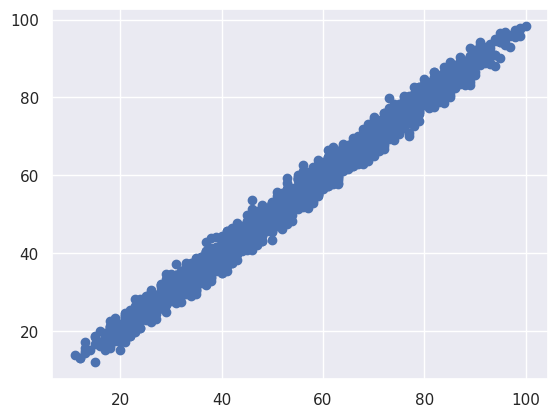

In [93]:
plt.scatter(y_val, y_val_predict)
plt.show()

## Assumption 6 - Normality of Residual

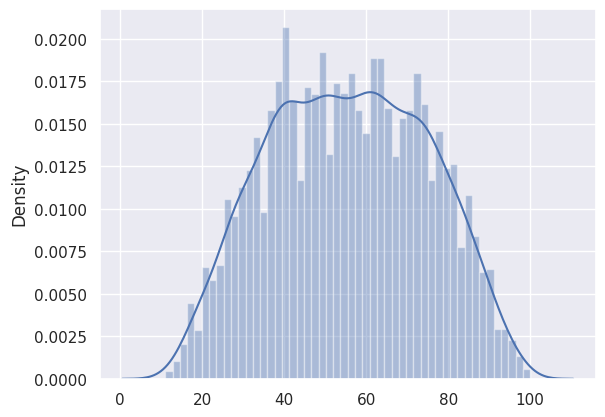

In [94]:
sns.distplot((y_val, y_val_predict), bins=50)
plt.show()

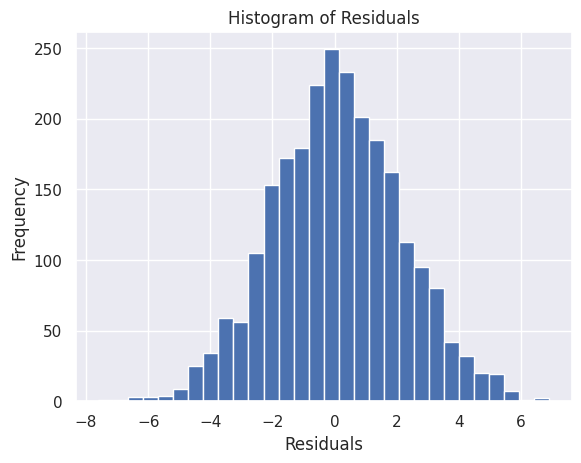

In [95]:
residuals = y_val - y_val_predict
plt.hist(residuals, bins=30)
plt.title("Histogram of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

### Q-Q Plot

In [96]:
import statsmodels.api as sm

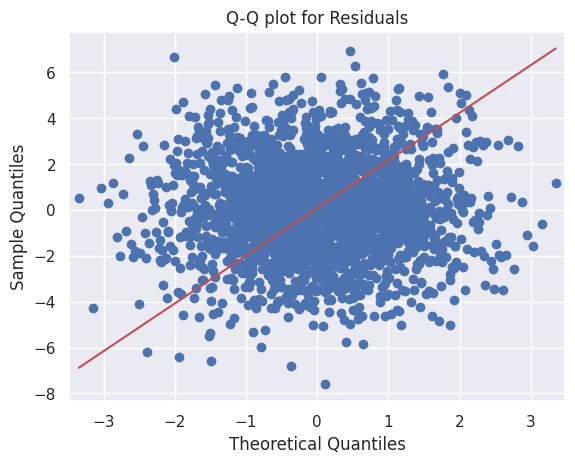

In [97]:
sm.qqplot(residuals, line='s')
plt.title("Q-Q plot for Residuals")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()